In [7]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import os

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!zip -r "/content/drive/MyDrive/dataset.zip" "/content/drive/MyDrive/dataset"

  adding: content/drive/MyDrive/dataset/ (stored 0%)
  adding: content/drive/MyDrive/dataset/train/ (stored 0%)
  adding: content/drive/MyDrive/dataset/train/class3/ (stored 0%)
  adding: content/drive/MyDrive/dataset/train/class3/Dust (77).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/train/class3/Dust (7).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/train/class3/Dust (80).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/train/class3/Dust (75).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/train/class3/Dust (70).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/train/class3/Dust (8).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/train/class3/Dust (73).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/train/class3/Dust (76).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/train/class3/Dust (69).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/train/class3/Dust (72).jpg (deflated 0%)
  adding: cont

In [5]:
import zipfile
import os

# Path to your .zip file in Google Drive
zip_path = "/content/drive/MyDrive/dataset.zip"

# Folder to extract to
extract_path = "/content/dataset"

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Unzipped to:", extract_path)

✅ Unzipped to: /content/dataset


In [8]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

In [9]:
data_dir = '/content/dataset/content/drive/MyDrive/dataset'

# Create data loaders
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x), data_transforms[x]) for x in ['train', 'val']}
#image_datasets

In [10]:
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=4, shuffle=True, num_workers=4) for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
print(dataset_sizes)

class_names = image_datasets['train'].classes
class_names

{'train': 634, 'val': 235}


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


['class1', 'class2', 'class3', 'class4', 'class5', 'class6']

In [ ]:
# Load the pre-trained ResNet-18 model
model = models.resnet18(pretrained=True)

# Freeze all layers except the final classification layer
for name, param in model.named_parameters():
    if "fc" in name: 
        param.requires_grad = True
    else:
        param.requires_grad = False

# Define the loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9) 


# Move the model to the GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 170MB/s]


In [12]:
# Training loop
num_epochs = 10
for epoch in range(num_epochs):
    for phase in ['train', 'val']:
        if phase == 'train':
            model.train()
        else:
            model.eval()

        running_loss = 0.0
        running_corrects = 0

        for inputs, labels in dataloaders[phase]:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            with torch.set_grad_enabled(phase == 'train'):
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                if phase == 'train':
                    loss.backward()
                    optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / dataset_sizes[phase]
        epoch_acc = running_corrects.double() / dataset_sizes[phase]

        print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

print("Training complete!")

train Loss: 2.5764 Acc: 0.3155
val Loss: 1.3499 Acc: 0.5915
train Loss: 1.4753 Acc: 0.4842
val Loss: 1.1119 Acc: 0.6894
train Loss: 1.3008 Acc: 0.5678
val Loss: 1.1158 Acc: 0.6596
train Loss: 1.0955 Acc: 0.6151
val Loss: 0.8418 Acc: 0.7234
train Loss: 1.2465 Acc: 0.5946
val Loss: 0.8380 Acc: 0.7277
train Loss: 1.2092 Acc: 0.5978
val Loss: 0.8579 Acc: 0.7319
train Loss: 1.0672 Acc: 0.6262
val Loss: 0.7019 Acc: 0.7574
train Loss: 1.0189 Acc: 0.6435
val Loss: 0.6084 Acc: 0.7787
train Loss: 1.0480 Acc: 0.6388
val Loss: 0.6929 Acc: 0.7745
train Loss: 0.9474 Acc: 0.6577
val Loss: 0.7382 Acc: 0.7447
Training complete!


In [13]:
# Save the model
torch.save(model.state_dict(), 'solar_classification_model.pth')

In [ ]:
import torch
from torchvision import models, transforms
from PIL import Image

# Load the saved model
model = models.resnet18(pretrained=True)
model.fc = nn.Linear(model.fc.in_features, 1000)  
model.load_state_dict(torch.load('solar_classification_model.pth'))
model.eval()

# Create a new model with the correct final layer
new_model = models.resnet18(pretrained=True)
new_model.fc = nn.Linear(new_model.fc.in_features, 2)  

# Copy the weights and biases from the loaded model to the new model
new_model.fc.weight.data = model.fc.weight.data[0:2]  
new_model.fc.bias.data = model.fc.bias.data[0:2]

In [ ]:
# Load and preprocess the unseen image
image_path = '/content/drive/MyDrive/solar.jpg' 
image = Image.open(image_path)
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
input_tensor = preprocess(image)
input_batch = input_tensor.unsqueeze(0) 

In [18]:
# Load a pretrained model
model = models.resnet18(pretrained=True)
model.eval()

# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
input_batch = input_batch.to(device)

# Predict
with torch.no_grad():
    output = model(input_batch)

# Get top prediction
_, predicted_class = torch.max(output, 1)
print(f"Predicted class index: {predicted_class.item()}")


Predicted class index: 807


In [19]:
import json
import urllib.request

# Download ImageNet class labels
url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
urllib.request.urlretrieve(url, "imagenet_classes.txt")

# Load class names
with open("imagenet_classes.txt") as f:
    classes = [line.strip() for line in f.readlines()]

print("Predicted class label:", classes[predicted_class.item()])

Predicted class label: solar dish


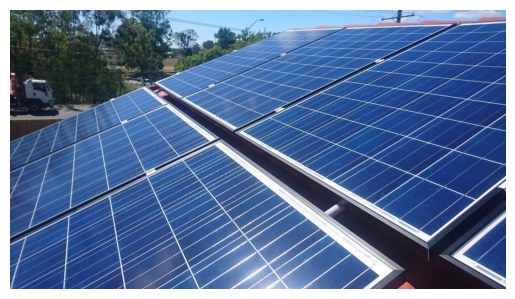

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Display the image with the predicted class name
image = np.array(image)
plt.imshow(image)
plt.axis('off')
#plt.text(10, 10, f'Predicted: {predicted_class_name}', fontsize=12, color='white', backgroundcolor='red')
plt.show()

In [40]:
!zip -r /content/drive/MyDrive/dataset/val.zip /content/drive/MyDrive/dataset/val

  adding: content/drive/MyDrive/dataset/val/ (stored 0%)
  adding: content/drive/MyDrive/dataset/val/class4/ (stored 0%)
  adding: content/drive/MyDrive/dataset/val/class4/Electrical (72).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class4/Electrical (79).jpg (deflated 1%)
  adding: content/drive/MyDrive/dataset/val/class4/Electrical (76).jpg (deflated 1%)
  adding: content/drive/MyDrive/dataset/val/class4/Electrical (97).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class4/Electrical (82).jpg (deflated 2%)
  adding: content/drive/MyDrive/dataset/val/class4/Electrical (95).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class4/Electrical (75).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class4/Electrical (96).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class4/Electrical (92).jpg (deflated 0%)
  adding: content/drive/MyDrive/dataset/val/class4/Electrical (81).jpg (deflated 2%)
  adding: content/drive/MyDri

In [42]:
import zipfile

zip_path = "/content/drive/MyDrive/dataset/val.zip"
extract_path = "/content/dataset"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Unzipped to:", extract_path)

✅ Unzipped to: /content/dataset


In [ ]:
## Load and preprocess the unseen image
image_path = '/content/drive/MyDrive/dataset/val/class1/Bird (148).jpg'  
image = Image.open(image_path)
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
input_tensor = preprocess(image)
input_batch = input_tensor.unsqueeze(0)  

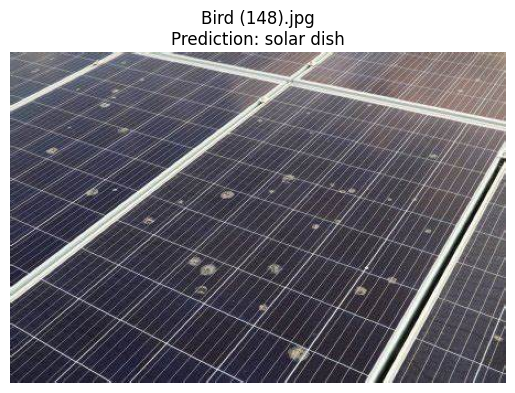

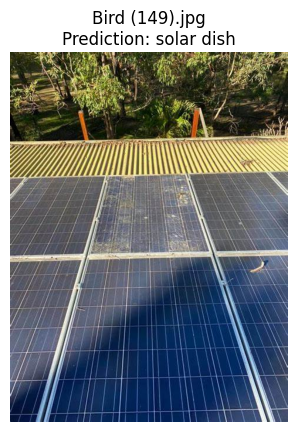

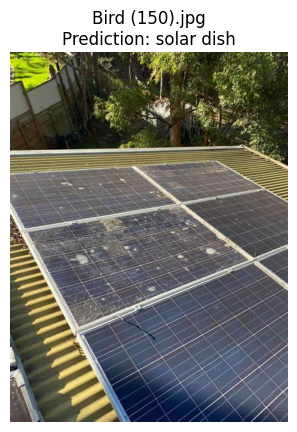

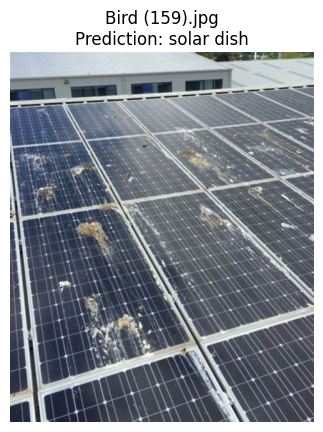

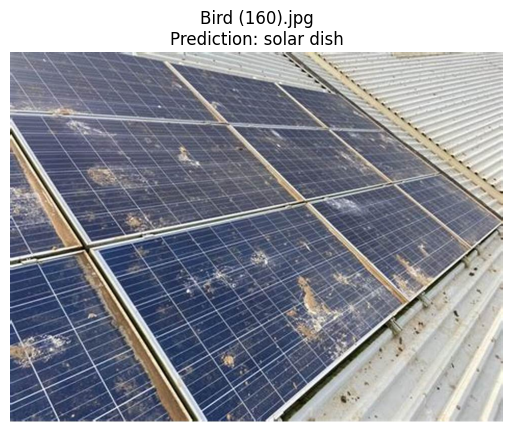

...

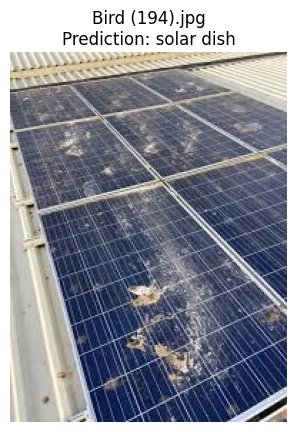

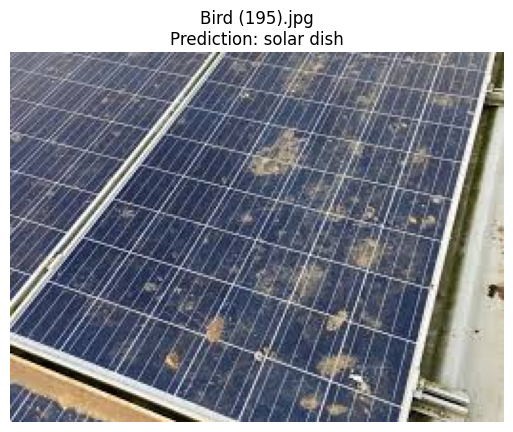

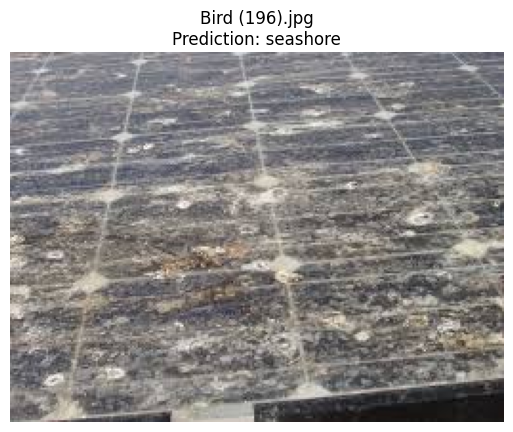

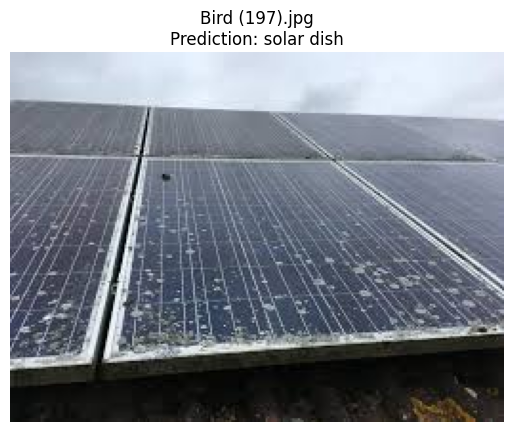

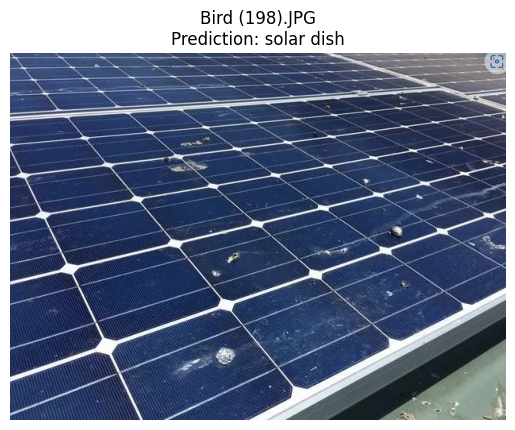

In [ ]:
import os
from PIL import Image
import torch
from torchvision import models, transforms
import matplotlib.pyplot as plt
import urllib.request

# Folder containing test images
folder_path = "/content/drive/MyDrive/dataset/val/class1"  

# 1. Define image preprocessing pipeline
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# 2. Load pretrained model
model = models.resnet18(pretrained=True)
model.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# 3. Load ImageNet class labels
label_path = "imagenet_classes.txt"
if not os.path.exists(label_path):
    urllib.request.urlretrieve(
        "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt",
        label_path
    )

with open(label_path) as f:
    labels = [line.strip() for line in f.readlines()]

# 4. Loop through all images in the folder
image_files = sorted([f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])

if not image_files:
    print("❌ No image files found in the folder.")
else:
    for file in image_files:
        image_path = os.path.join(folder_path, file)
        image = Image.open(image_path).convert('RGB')

        # Preprocess and prepare batch
        input_tensor = preprocess(image)
        input_batch = input_tensor.unsqueeze(0).to(device)

        # Predict
        with torch.no_grad():
            output = model(input_batch)
        _, predicted_idx = torch.max(output, 1)
        predicted_label = labels[predicted_idx.item()]

        # Display image with predicted label
        plt.imshow(image)
        plt.title(f"{file}\nPrediction: {predicted_label}", fontsize=12)
        plt.axis('off')
        plt.show()